# Introduction

This notebook mainly shows how I collect the information of cat and dog breeds, following is my steps:

1. Collect summary of animal information from Wikipedia and summarize these information by a language model.

2. Save these information into MySQL database for further application.

## In colab

The first step is completed on the [google colab](https://colab.research.google.com/), and I use [Wikipedia-API](https://pypi.org/project/Wikipedia-API/) to get all the information of each animal breed, however, these information needs to be summarized, I apply the [facebook/bart-large-cnn](https://huggingface.co/facebook/bart-large-cnn) model from Hugging Face, finally I will get all the summarized information and relative URL link about the animal breed to use in my project.

In [1]:
!pip install Wikipedia-API

  Preparing metadata (setup.py) ... done
  Created wheel for Wikipedia-API: filename=Wikipedia_API-0.7.1-py3-none-any.whl size=14347 sha256=21a6e961f98e9a7de1e797372898c2ca67aa43a58793b98206c381743d451b1d
  Stored in directory: /root/.cache/pip/wheels/4c/96/18/b9201cc3e8b47b02b510460210cfd832ccf10c0c4dd0522962
Successfully built Wikipedia-API


In [2]:
import datetime
import wikipediaapi
import numpy as np
from tqdm import tqdm
from time import sleep
from pathlib import Path
from dateutil.relativedelta import *
from transformers import pipeline

def local_now(hours = 8):
  return datetime.datetime.now() + relativedelta(hours = hours)

home_dir = str(Path.cwd())
print(f"Home path: {home_dir}")
print(local_now())

Home path: /content
2024-10-03 16:28:31.510921


In [3]:
# Load NLP model for paragraph summarization
summarizer = pipeline("summarization", model="facebook/bart-large-cnn")

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.58k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.63G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/363 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/899k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/1.36M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(
Hardware accelerator e.g. GPU is available in the environment, but no `device` argument is passed to the `Pipeline` object. Model will be on CPU.


In [4]:
wiki_wiki = wikipediaapi.Wikipedia('Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/129.0.0.0 Safari/537.3', 'en')

In [5]:
# Animal classes
cat_breeds = np.array(['Abyssinian', 'Bengal', 'Birman', 'Bombay', 'British Shorthair','Egyptian Mau',
            'Maine Coon', 'Persian', 'Ragdoll', 'Russian Blue', 'Siamese', 'Sphynx'])

dog_breeds = np.array(['american bulldog', 'american pit bull terrier', 'basset hound', 'beagle',
            'boxer', 'chihuahua', 'english cocker spaniel', 'english setter', 'german shorthaired',
            'great pyrenees', 'havanese', 'japanese chin', 'keeshond', 'leonberger', 'miniature pinscher',
            'newfoundland', 'pomeranian', 'pug', 'saint bernard', 'samoyed', 'scottish terrier', 'shiba inu',
            'staffordshire bull terrier', 'wheaten terrier', 'yorkshire terrier'])

In [6]:
cat_breeds_introductions = {}

for cat in tqdm(cat_breeds):
    page_py = wiki_wiki.page(f'{cat} cat')
    cat_full_summary = page_py.summary
    cat_summarized_paragraph = summarizer(cat_full_summary, max_length=50, min_length=30, do_sample=False)
    cat_breeds_introductions[cat] = (page_py.fullurl, cat_summarized_paragraph[0]['summary_text'])
    sleep(1)

100%|██████████| 12/12 [02:29<00:00, 12.49s/it]


In [7]:
cat_breeds_introductions.get('Abyssinian')

('https://en.wikipedia.org/wiki/Abyssinian_cat',
 'The Abyssinian is a breed of cat with a distinctive "ticked" tabby coat. The first members of the breed to be exhibited in England were brought there from Abyssinia (now known as Ethiopia), hence the name.')

In [8]:
dog_breeds_introductions = {}

dog_suffix = ["boxer", "chihuahua", "havanese", "newfoundland", "pomeranian", "samoyed"]
for dog in tqdm(dog_breeds):
  if dog in dog_suffix:
    keyword = dog.title() + " dog"
  elif dog == "german shorthaired":
    keyword = "German_Shorthaired_Pointer"
  elif dog == "saint bernard":
    keyword = "St._Bernard_(dog_breed)"
  else:
    keyword = dog.title()
  page_py = wiki_wiki.page(keyword)
  dog_full_summary = page_py.summary
  dog_summarized_paragraph = summarizer(dog_full_summary, max_length=35, min_length=30, do_sample=False)
  dog_breeds_introductions[dog] = (page_py.fullurl, dog_summarized_paragraph[0]['summary_text'])
  sleep(1)

100%|██████████| 25/25 [03:56<00:00,  9.46s/it]


In [9]:
dog_breeds_introductions.get('american bulldog')

('https://en.wikipedia.org/wiki/American_Bulldog',
 'The American bulldog is a large, muscular breed of mastiff-type dog. Their ancestors were brought to the British North American colonies where they worked on small')

In [10]:
# save introductions as pickle file
import pickle

data = [cat_breeds_introductions, dog_breeds_introductions]
with open('introduction_data.pkl', 'wb') as pickle_file:
    pickle.dump(data, pickle_file)

## In local computer

In this step I will use `mysql.connector` package to connect to MySQL database and save them into `animal` table.

In [1]:
import pickle

# Load pickle file
with open('introduction_data.pkl', 'rb') as pickle_file:
    loaded_data = pickle.load(pickle_file)

In [2]:
cat_breeds_introductions, dog_breeds_introductions = loaded_data

In [3]:
# Saave introduction to MySQL database
import mysql.connector
from mysql_info import DATABASE_NAME, HOST, PORT, USER, PASSWORD

In [4]:
import base64
import random
import numpy as np
from PIL import Image
from io import BytesIO
from pathlib import Path
import matplotlib.pyplot as plt
%matplotlib inline

In [6]:
# Prepare 2 images for each breed
IMAGE_DIR = "C:\\Users\\User\\Desktop\\cat_dog_dataset\\test_images" # You can change your path
cat_image_dir = Path(IMAGE_DIR).joinpath("cats")
dog_image_dir = Path(IMAGE_DIR).joinpath("dogs")

def create_animal_images(img_dir:str, breed_info:dict):
    images = {}
    for breed in breed_info.keys():
        image_paths = list(img_dir.joinpath(breed).iterdir())
        selected_image = random.sample(image_paths, k=2)
        images[breed] = selected_image

    return images

def convert_images_to_base64(image_dict):
    base64_dict = {}

    for breed, image_paths in image_dict.items():
        base64_list = []
        for image_path in image_paths:
            with open(image_path, "rb") as image_file:
                # read image and encode to base64 data type
                encoded_string = base64.b64encode(image_file.read()).decode('utf-8')
                base64_list.append(encoded_string)
        base64_dict[breed] = base64_list

    return base64_dict

def show_images_from_base64(base64_dict, figsize=(15, 10)):
    # Create a figure for displaying images
    fig, axes = plt.subplots(len(base64_dict), max(len(images) for images in base64_dict.values()), figsize=figsize)

    # Iterate through the dictionary containing breeds and their base64 image lists
    for i, (breed, base64_list) in enumerate(base64_dict.items()):
        for j, base64_string in enumerate(base64_list):
            # Decode the base64 string into bytes
            image_data = base64.b64decode(base64_string)
            # Convert the byte data to a PIL image
            image = Image.open(BytesIO(image_data))

            # Display the image in the subplot
            ax = axes[i, j] if len(base64_dict) > 1 else axes[j]
            ax.imshow(image)
            ax.axis('off')  # Turn off axis

            # Set title for the first image of each breed
            if j == 0:
                ax.set_title(breed, fontsize=14)

    plt.tight_layout()
    plt.show()

In [7]:
cat_images = create_animal_images(cat_image_dir, cat_breeds_introductions)
dog_images = create_animal_images(dog_image_dir, dog_breeds_introductions)

cat_base64_images = convert_images_to_base64(cat_images)
dog_base64_images = convert_images_to_base64(dog_images)

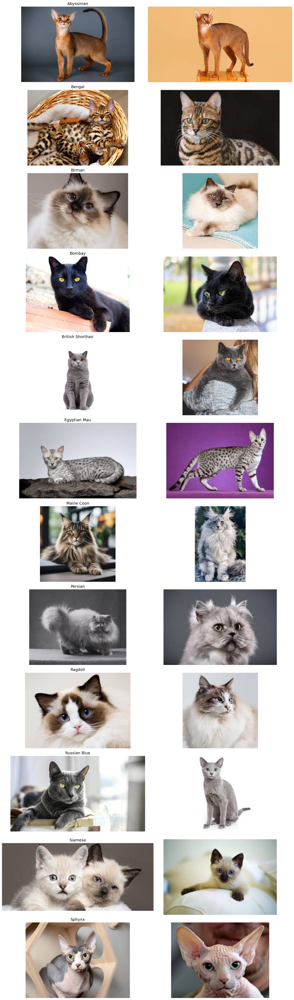

In [8]:
# Assume base64_images is the dictionary containing the base64 encoded images
show_images_from_base64(cat_base64_images, figsize=(15, 50))

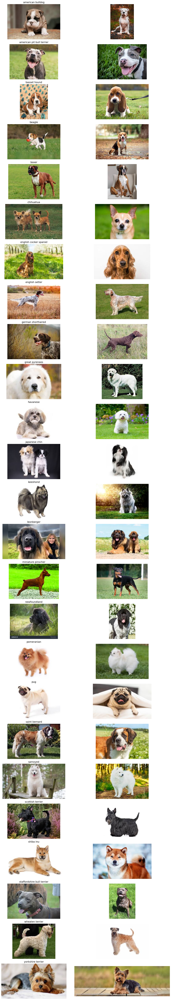

In [9]:
# Assume base64_images is the dictionary containing the base64 encoded images
show_images_from_base64(dog_base64_images, figsize=(15, 80))

In [11]:
def add_animal_info_to_MySQL(breeds_introductions:dict, base64_images:dict):
    """
    breeds_introductions: {breed: (link, description)}
    base64_images: {breed: [img1, img2, img3]}
    """
    # 1. Connect to database
    connection = mysql.connector.connect(host=HOST, port=PORT,
                                         user=USER, password=PASSWORD,
                                         database=DATABASE_NAME,
                                         auth_plugin='mysql_native_password')
    cursor = connection.cursor()
    cursor.execute("SET SQL_SAFE_UPDATES = 0;")

    # 2. Prepare introduction data
    for breed in breeds_introductions.keys():
        link, description = breeds_introductions[breed]
        image1, image2 = base64_images[breed]

        # 3. Execute db query
        add_animal_info_query = ("INSERT INTO `animal`"
                                 "(animal_breed, image_1, image_2, animal_description, animal_link)"
                                 "VALUES(%s, %s, %s, %s, %s)")
        animal_info_data = (breed, image1, image2, description, link)
        cursor.execute(add_animal_info_query, animal_info_data)

    # 4. Close the connection
    cursor.close()
    connection.commit()
    connection.close()

In [12]:
add_animal_info_to_MySQL(cat_breeds_introductions, cat_base64_images)

In [13]:
add_animal_info_to_MySQL(dog_breeds_introductions, dog_base64_images)